In [21]:
import lasio
import seaborn
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

In [2]:
#%% Loading DataSet

#Alaska dataSet
alaska2 = lasio.read('well_logs/dados_alaska/dado2.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
alaska2['DEPTH'] = alaska2.index
print('Alaska 2 - Correlações')
print(alaska2.corr())
alaska3 = lasio.read('well_logs/dados_alaska/dado3.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
alaska3['DEPTH'] = alaska3.index
print('Alaska 3 - Correlações')
print(alaska3.corr())
alaska4 = lasio.read('well_logs/dados_alaska/dado4.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
print('Alaska 4 - Correlações')
print(alaska4.corr())
alaska5 = lasio.read('well_logs/dados_alaska/dado5.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
print('Alaska 5 - Correlações')
alaska5['DEPTH'] = alaska5.index
print(alaska5.corr())



Alaska 2 - Correlações
           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.322254 -0.250311  0.291251 -0.145727  0.278628
NPHI  -0.322254  1.000000  0.522223  0.503283 -0.164131 -0.428740
DT    -0.250311  0.522223  1.000000  0.325420 -0.141120 -0.444379
GR     0.291251  0.503283  0.325420  1.000000 -0.283312 -0.023131
ILD   -0.145727 -0.164131 -0.141120 -0.283312  1.000000  0.023544
DEPTH  0.278628 -0.428740 -0.444379 -0.023131  0.023544  1.000000
Alaska 3 - Correlações
           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.428836 -0.377076 -0.012439  0.294842  0.621318
NPHI  -0.428836  1.000000  0.520852  0.671720 -0.693584 -0.502024
DT    -0.377076  0.520852  1.000000  0.377237 -0.403318 -0.709686
GR    -0.012439  0.671720  0.377237  1.000000 -0.583643 -0.326429
ILD    0.294842 -0.693584 -0.403318 -0.583643  1.000000  0.304397
DEPTH  0.621318 -0.502024 -0.709686 -0.326429  0.304397  1.000000
Alaska 4 - Correlações
       

(0.0, 40.0)

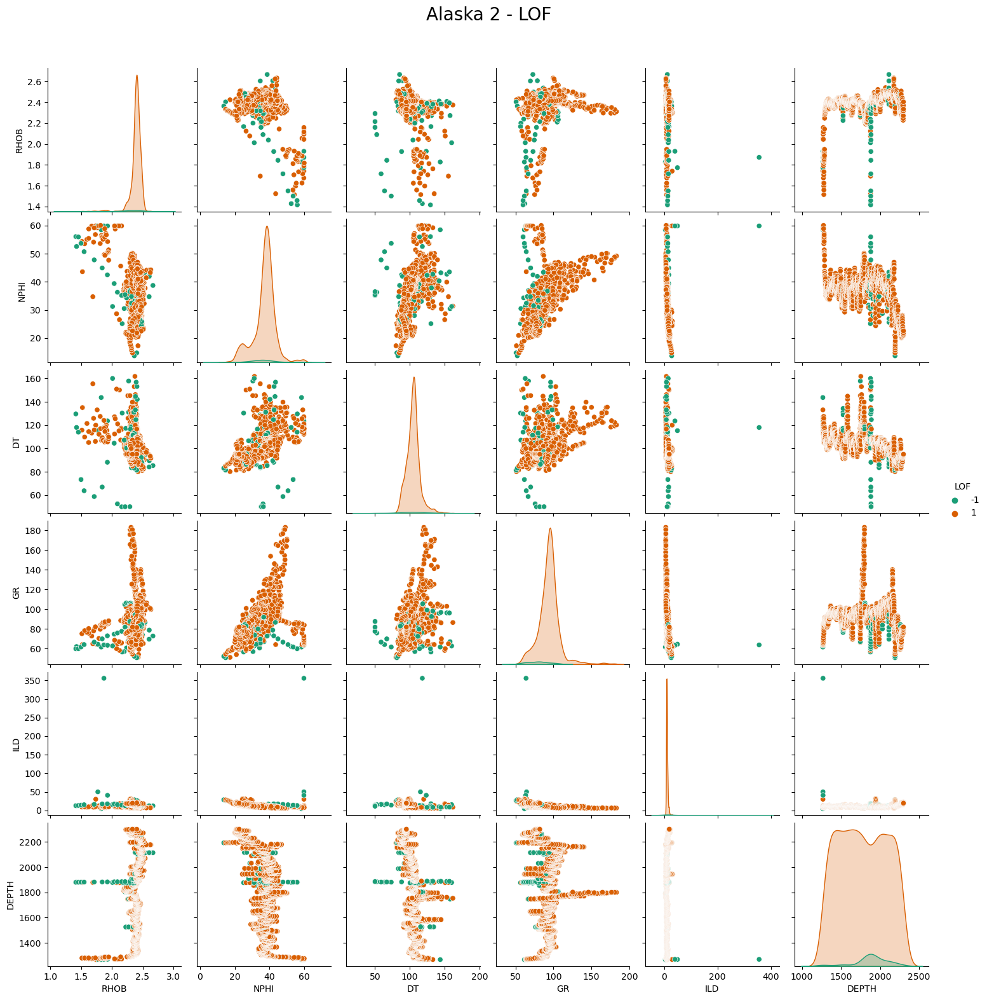

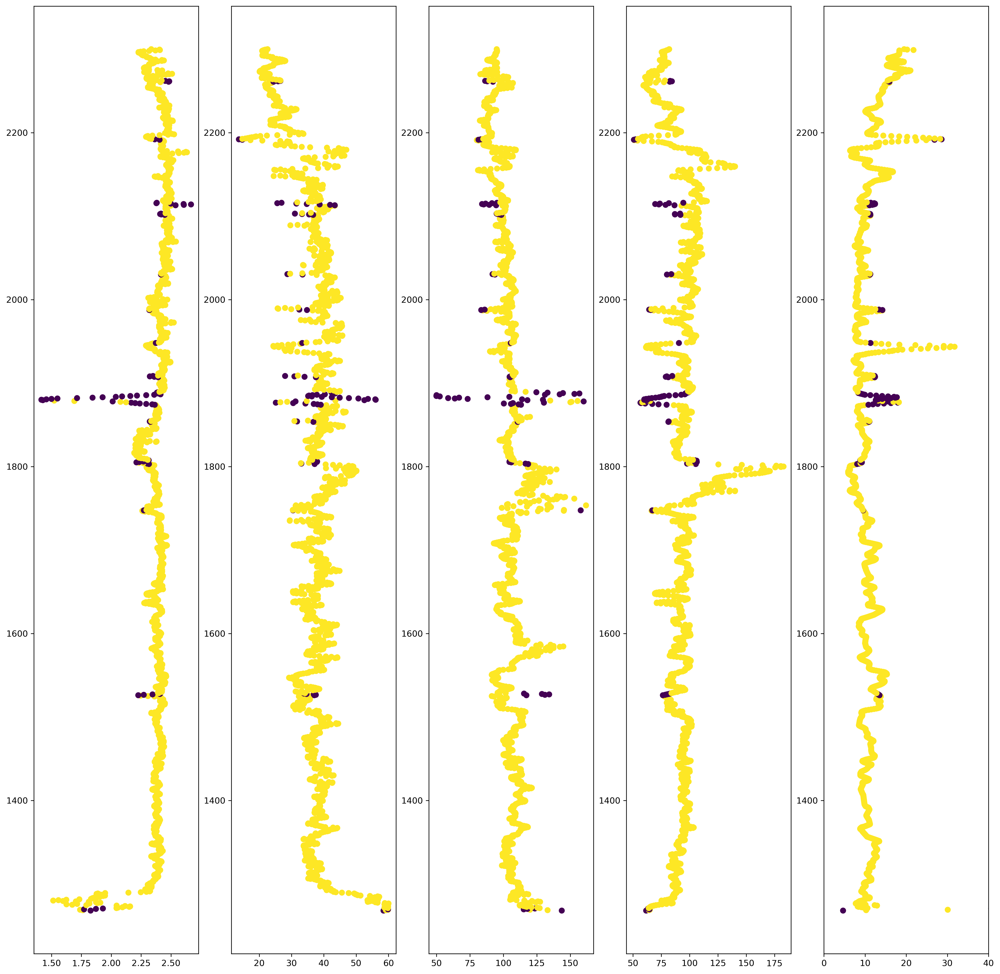

In [3]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors=20)

#### Alaska2
alaska2_lof = lof.fit_predict(alaska2)
alaska2['LOF'] = alaska2_lof
seaborn.pairplot(alaska2, hue='LOF', palette='Dark2').fig.suptitle("Alaska 2 - LOF", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(151)
plt.scatter(alaska2['RHOB'], alaska2.index, c=alaska2_lof)
plt.subplot(152)
plt.scatter(alaska2['NPHI'], alaska2.index, c=alaska2_lof)
plt.subplot(153)
plt.scatter(alaska2['DT'], alaska2.index, c=alaska2_lof)
plt.subplot(154)
plt.scatter(alaska2['GR'], alaska2.index, c=alaska2_lof)
plt.subplot(155)
plt.scatter(alaska2['ILD'], alaska2.index, c=alaska2_lof)
plt.xlim(0,40)


Correlações após o LOF aplicado
           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.285244 -0.333712  0.251376 -0.076080  0.316002
NPHI  -0.285244  1.000000  0.579056  0.550733 -0.720878 -0.428003
DT    -0.333712  0.579056  1.000000  0.361545 -0.501502 -0.472805
GR     0.251376  0.550733  0.361545  1.000000 -0.643623 -0.015206
ILD   -0.076080 -0.720878 -0.501502 -0.643623  1.000000  0.171605
DEPTH  0.316002 -0.428003 -0.472805 -0.015206  0.171605  1.000000


C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

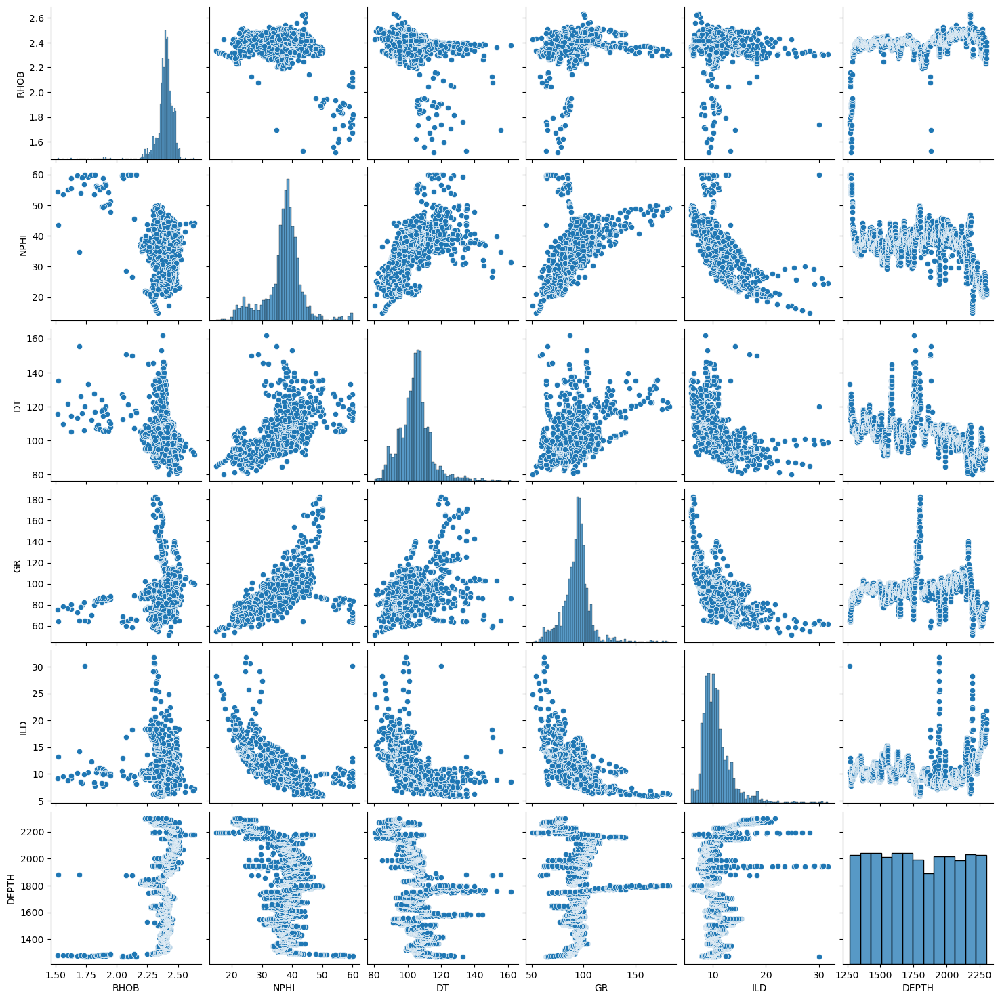

In [4]:
# Dropar outliers Alaska2
alaska2 = alaska2.drop(alaska2[alaska2['LOF']==-1].index)
alaska2 = alaska2.drop(['LOF'], axis = 1)
print('Correlações após o LOF aplicado')
print(alaska2.corr())
seaborn.pairplot(alaska2, palette='Dark2')

(0.0, 40.0)

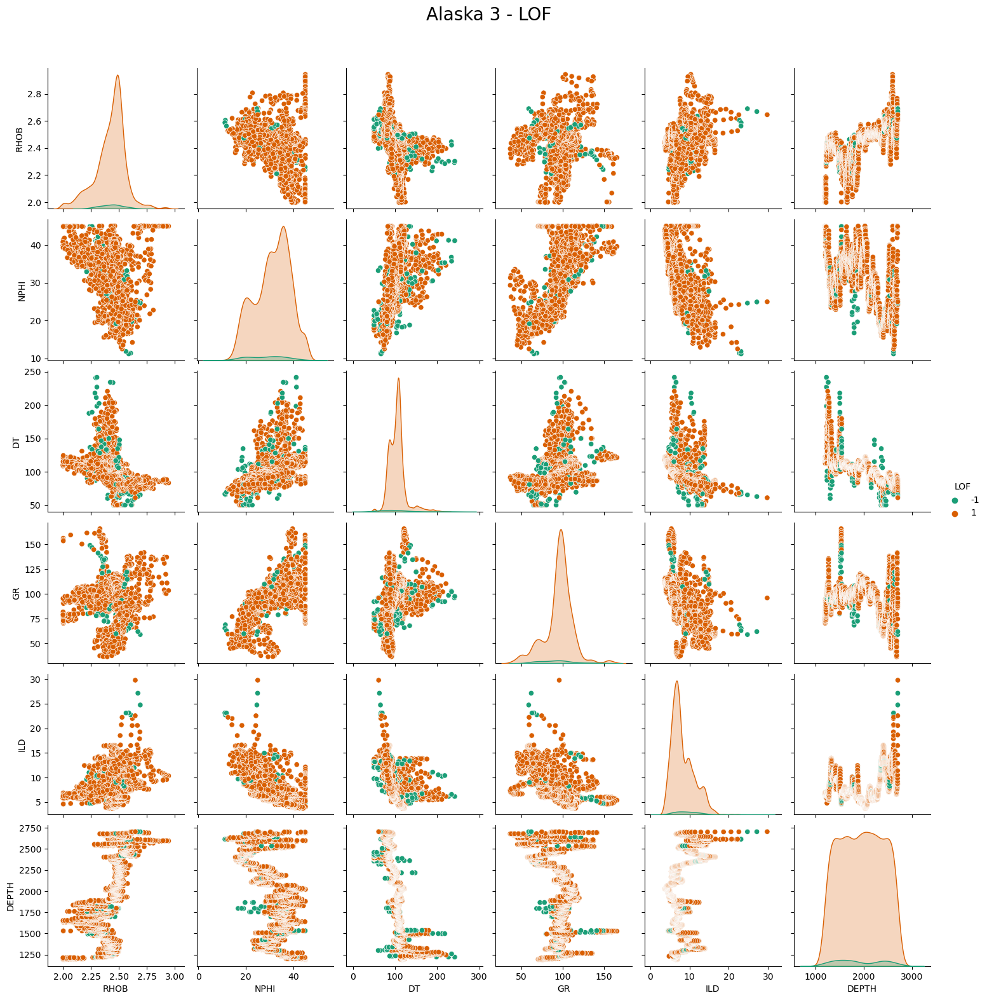

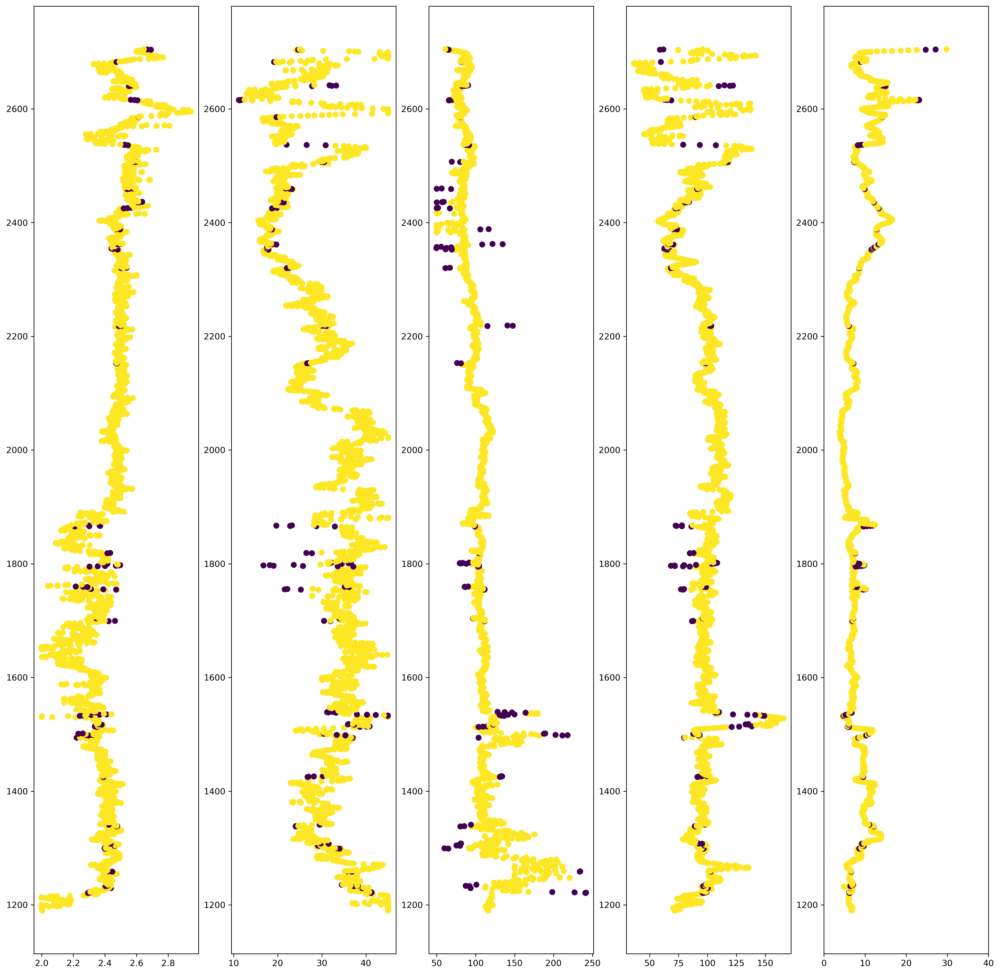

In [5]:
#### Alaska3
lof = LocalOutlierFactor(n_neighbors=20)

alaska3_lof = lof.fit_predict(alaska3)
alaska3['LOF'] = alaska3_lof
seaborn.pairplot(alaska3, hue='LOF', palette='Dark2').fig.suptitle("Alaska 3 - LOF", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(151)
plt.scatter(alaska3['RHOB'], alaska3.index, c=alaska3_lof)
plt.subplot(152)
plt.scatter(alaska3['NPHI'], alaska3.index, c=alaska3_lof)
plt.subplot(153)
plt.scatter(alaska3['DT'], alaska3.index, c=alaska3_lof)
plt.subplot(154)
plt.scatter(alaska3['GR'], alaska3.index, c=alaska3_lof)
plt.subplot(155)
plt.scatter(alaska3['ILD'], alaska3.index, c=alaska3_lof)
plt.xlim(0,40)



C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

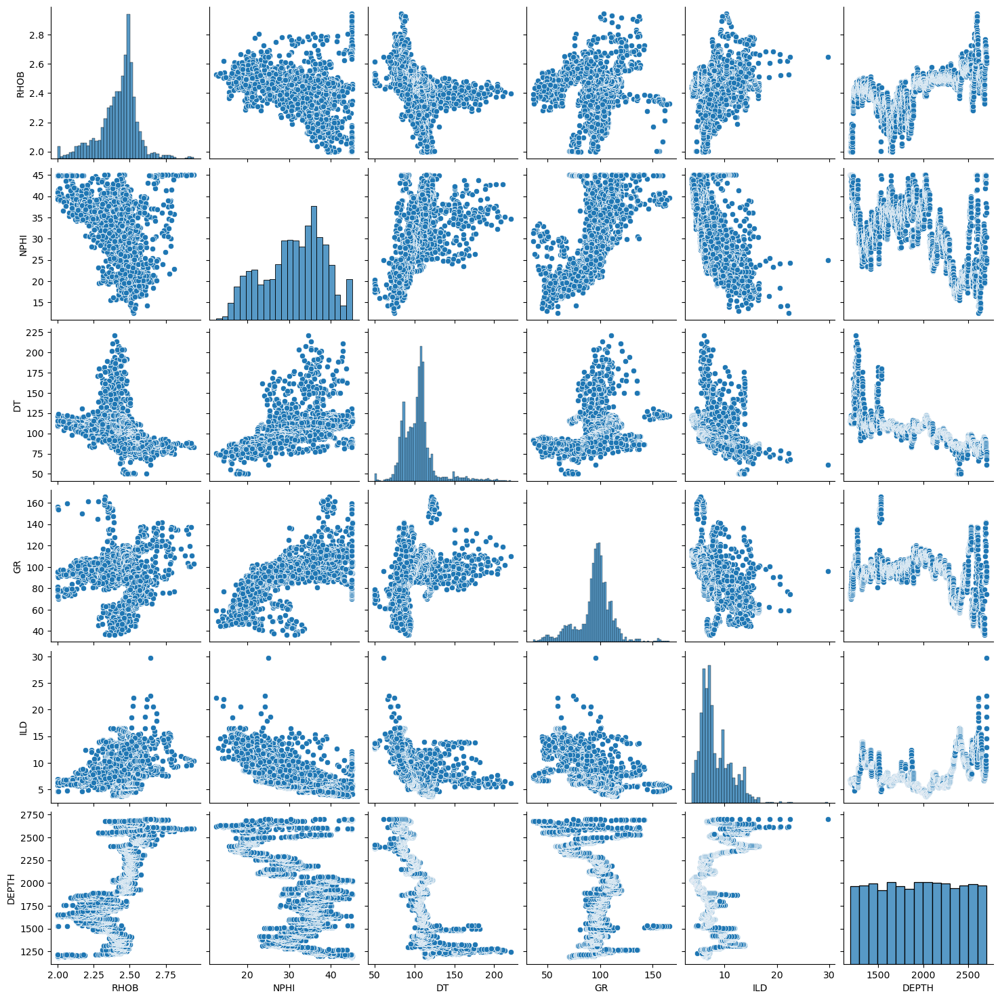

In [6]:
# Dropa alaska 3 com lof
alaska3 = alaska3.drop(alaska3[alaska3['LOF']==-1].index)
alaska3 = alaska3.drop(['LOF'], axis = 1)
alaska3.corr()
seaborn.pairplot(alaska3, palette='Dark2')

In [7]:
alaska3.corr()

,RHOB,NPHI,DT,GR,ILD,DEPTH
RHOB,1.000000,-0.423714,-0.379606,-0.000125,0.285360,0.619410
NPHI,-0.423714,1.000000,0.533993,0.664798,-0.694247,-0.497081
DT,-0.379606,0.533993,1.000000,0.390755,-0.414469,-0.739953
GR,-0.000125,0.664798,0.390755,1.000000,-0.583336,-0.321920
ILD,0.285360,-0.694247,-0.414469,-0.583336,1.000000,0.291367
DEPTH,0.619410,-0.497081,-0.739953,-0.321920,0.291367,1.000000


(0.0, 40.0)

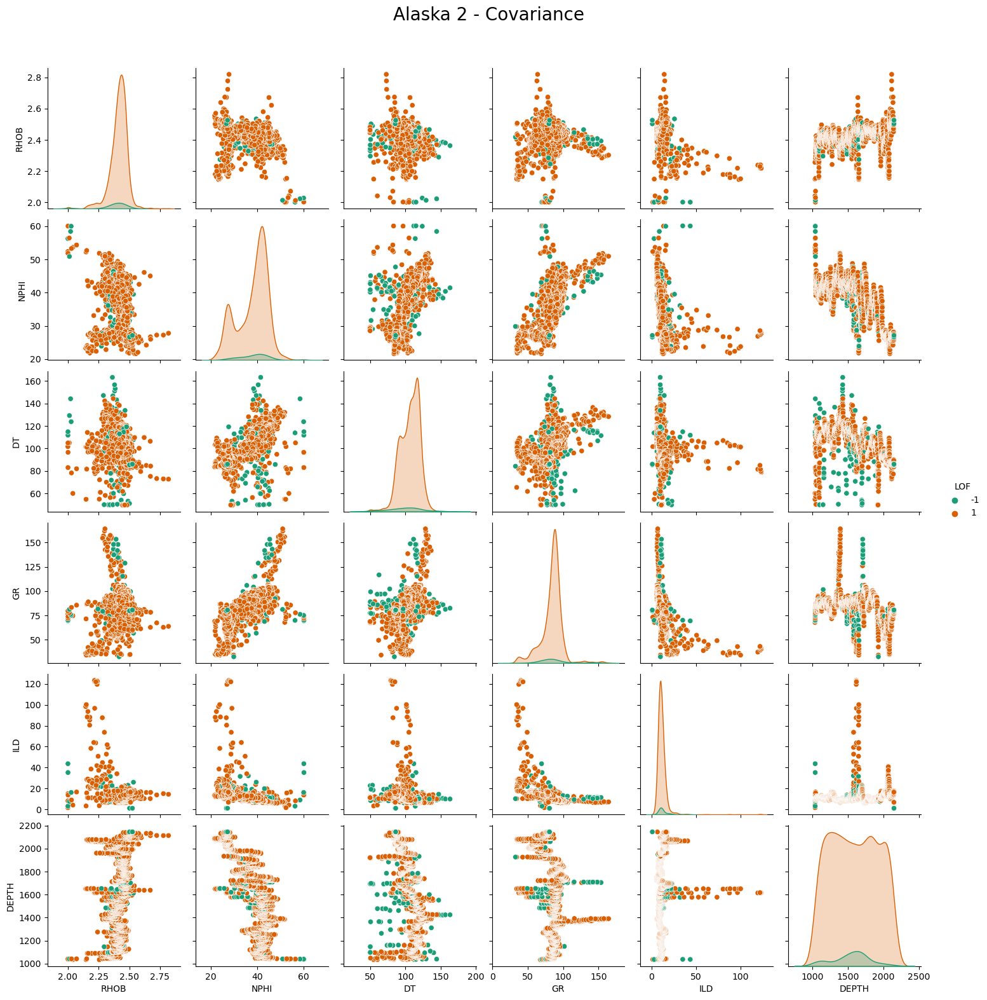

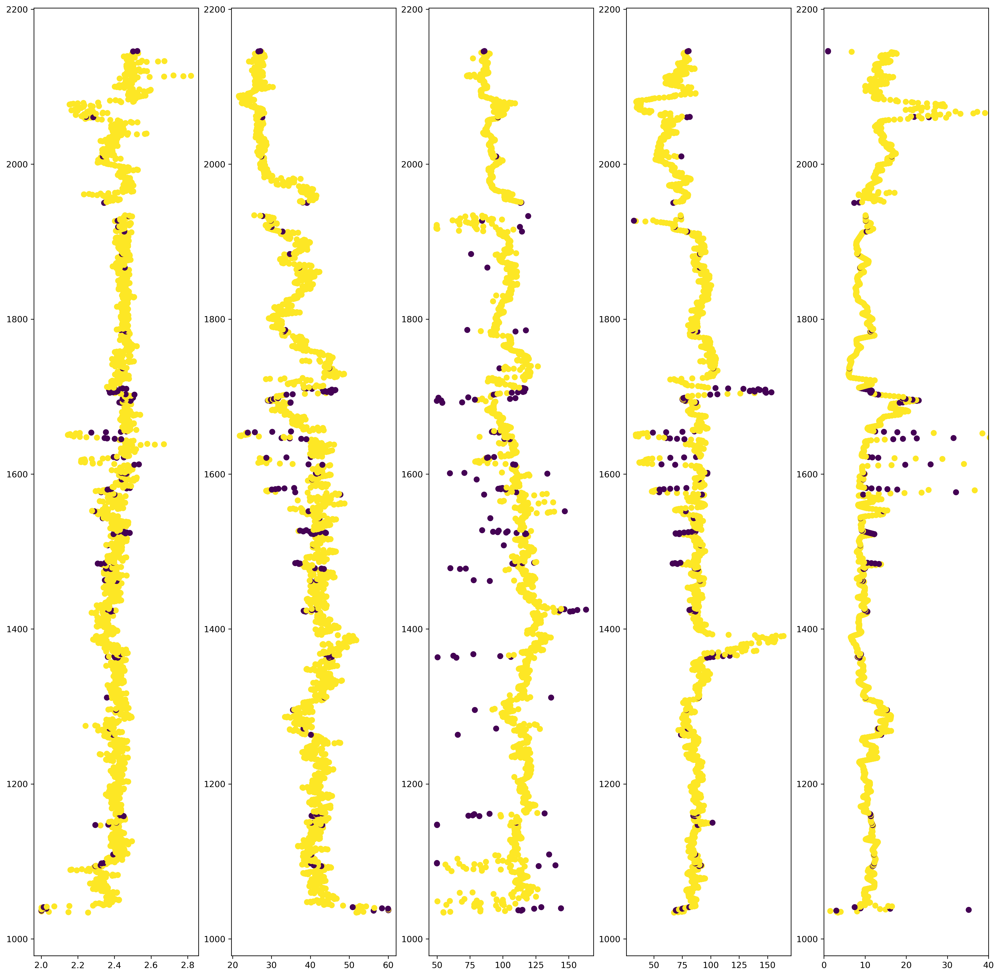

In [8]:
#### Alaska5
alaska5_lof = lof.fit_predict(alaska5.iloc[:,1:])
alaska5['LOF'] = alaska5_lof
seaborn.pairplot(alaska5, hue='LOF', palette='Dark2').fig.suptitle("Alaska 2 - Covariance", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(151)
plt.scatter(alaska5['RHOB'], alaska5.index, c=alaska5_lof)
plt.subplot(152)
plt.scatter(alaska5['NPHI'], alaska5.index, c=alaska5_lof)
plt.subplot(153)
plt.scatter(alaska5['DT'], alaska5.index, c=alaska5_lof)
plt.subplot(154)
plt.scatter(alaska5['GR'], alaska5.index, c=alaska5_lof)
plt.subplot(155)
plt.scatter(alaska5['ILD'], alaska5.index, c=alaska5_lof)
plt.xlim(0,40)

           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.190430 -0.197600  0.176471 -0.335214  0.306435
NPHI  -0.190430  1.000000  0.719521  0.697137 -0.393001 -0.729397
DT    -0.197600  0.719521  1.000000  0.532564 -0.251687 -0.566045
GR     0.176471  0.697137  0.532564  1.000000 -0.522794 -0.372550
ILD   -0.335214 -0.393001 -0.251687 -0.522794  1.000000  0.115932
DEPTH  0.306435 -0.729397 -0.566045 -0.372550  0.115932  1.000000


C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

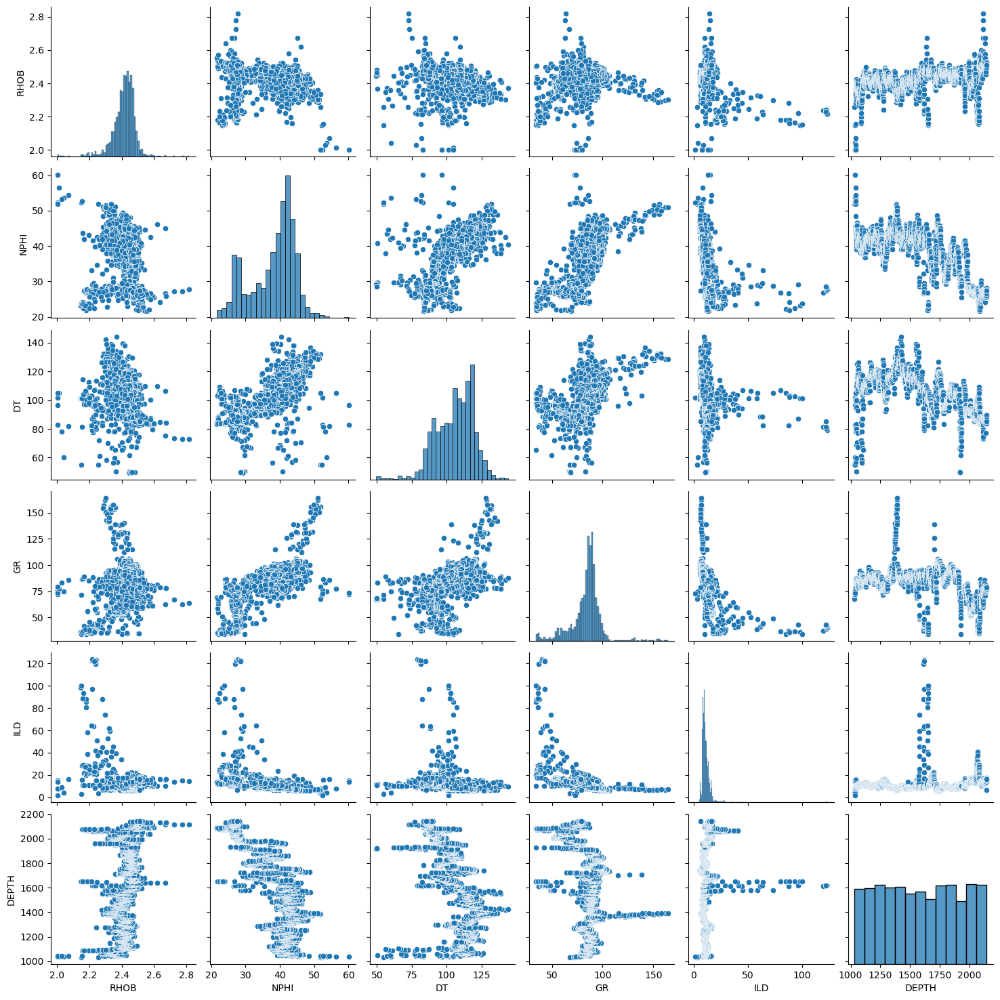

In [9]:
#drop alaska 5 com lof
alaska5 = alaska5.drop(alaska5[alaska5['LOF']==-1].index)
alaska5 = alaska5.drop(['LOF'], axis = 1)
print(alaska5.corr())
seaborn.pairplot(alaska5, palette='Dark2') 

# Concatenate data

In [18]:
alaska_concat = pd.concat([alaska2,alaska3])

In [12]:
alaska_concat.corr()

,RHOB,NPHI,DT,GR,ILD,DEPTH
RHOB,1.000000,-0.402398,-0.363751,0.078053,0.091701,0.553123
NPHI,-0.402398,1.000000,0.493053,0.564147,-0.443969,-0.509412
DT,-0.363751,0.493053,1.000000,0.374420,-0.375457,-0.671850
GR,0.078053,0.564147,0.374420,1.000000,-0.568108,-0.222454
ILD,0.091701,-0.443969,-0.375457,-0.568108,1.000000,0.141858
DEPTH,0.553123,-0.509412,-0.671850,-0.222454,0.141858,1.000000


In [105]:
X_ref = alaska_concat.loc[:,['NPHI','DT','GR', 'ILD']]
y_ref = alaska_concat.iloc[:,0]
X_alaska5 = alaska5.loc[:,['NPHI','DT','GR', 'ILD']]
y_alaska5 = alaska5.iloc[:,0]

# Train Test Split

In [106]:


X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.33, random_state=7)

# Power Transform aplication

In [107]:
pt = PowerTransformer()
y_pt = PowerTransformer()
X_train_pt = pt.fit_transform(X_train)
y_train_pt = y_pt.fit_transform(np.array(y_train).reshape(-1,1))
X_test_pt = pt.transform(X_test)
y_test_pt = y_pt.transform(np.array(y_test).reshape(-1,1))
X_alaska5_pt = pt.transform(X_alaska5)
y_alaska5_pt = y_pt.transform(np.array(y_alaska5).reshape(-1,1))

# SVR model

In [108]:
from sklearn.svm import SVR

svr_model = SVR().fit(X_train_pt, y_train_pt)

y_train_pred = y_pt.inverse_transform(svr_model.predict(X_train_pt).reshape(-1,1))
y_test_pred = y_pt.inverse_transform(svr_model.predict(X_test_pt).reshape(-1,1))

from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse

print('MSE train: {}'.format(mse(y_train, y_train_pred)))
print('MSE test: {}'.format(mse(y_test, y_test_pred)))
print('R^2 train: {}'.format(r2(y_train, y_train_pred)))
print('R^2 test: {}'.format(r2(y_test, y_test_pred)))


y_alaska5_pred = y_pt.inverse_transform(svr_model.predict(X_alaska5_pt).reshape(-1,1))

print('MSE in alaska 5: {}'.format(mse(y_alaska5, y_alaska5_pred)))
print('R^2 in alaska 5: {}'.format(r2(y_alaska5, y_alaska5_pred)))

C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MSE train: 0.0032661041388542763
MSE test: 0.003459805247869307
R^2 train: 0.783653910165959
R^2 test: 0.7803453086474127
MSE in alaska 5: 0.009348745105866817
R^2 in alaska 5: -0.8993298026475676


In [125]:
# Buscar o melhor epsilon na escala logaritma

epsilon = np.array([])
r2_train = np.array([])
r2_test = np.array([])
r2_alaska5 = np.array([])

mse_train = np.array([])
mse_test = np.array([])
mse_alaska5 = np.array([])

degree = np.array([])
for i in np.linspace(0.1, 0.05, 20):#:
    print("#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#")
    print('epsilon: {}'.format(i))
    epsilon = np.append(epsilon, i)
    
    svr_model = SVR(epsilon=i).fit(X_train_pt, y_train_pt)
    y_train_pred = y_pt.inverse_transform(svr_model.predict(X_train_pt).reshape(-1,1))
    y_test_pred = y_pt.inverse_transform(svr_model.predict(X_test_pt).reshape(-1,1))
    y_alaska5_pred = y_pt.inverse_transform(svr_model.predict((X_alaska5_pt)).reshape(-1,1))
    
    r2_train = np.append(r2_train, r2(y_train, y_train_pred))
    print('$R^2$ train: {}'.format(r2(y_train, y_train_pred)))
    r2_test = np.append(r2_test, r2(y_test, y_test_pred))
    print('$R^2$ test: {}'.format(r2(y_test, y_test_pred)))
    r2_alaska5 = np.append(r2_alaska5, r2(y_alaska5, y_alaska5_pred))
    print('$R^2$ alaska 5: {}'.format(r2(y_alaska5, y_alaska5_pred)))
    
    mse_train = np.append(mse_train, mse(y_train, y_train_pred))
    print('mse train: {}'.format(mse(y_train, y_train_pred)))
    mse_test = np.append(mse_test, mse(y_test, y_test_pred))
    print('mse test: {}'.format(mse(y_test, y_test_pred)))
    mse_alaska5 = np.append(mse_alaska5, mse(y_alaska5, y_alaska5_pred))
    print('mse alaska 5: {}'.format(mse(y_alaska5, y_alaska5_pred)))



position_max_r2 = np.where(r2_test == np.max(r2_test))
position_max_r2_alaska = np.where(r2_alaska5 == np.max(r2_alaska5))
position_min_mse = np.where(mse_test == np.min(mse_test))
best_epsilon = epsilon[position_max_r2] 

#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.1


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.783653910165959
$R^2$ test: 0.7803453086474127
$R^2$ alaska 5: -0.8993298026475676
mse train: 0.0032661041388542763
mse test: 0.003459805247869307
mse alaska 5: 0.009348745105866817
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09736842105263159


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7835541910314657
$R^2$ test: 0.780250588015277
$R^2$ alaska 5: -0.8849681718792322
mse train: 0.0032676095650819533
mse test: 0.003461297202983612
mse alaska 5: 0.009278055315620497
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09473684210526316


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7831724989140092
$R^2$ test: 0.7798427610630165
$R^2$ alaska 5: -0.875590383250028
mse train: 0.003273371842577004
mse test: 0.003467720930248278
mse alaska 5: 0.009231896636159502
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09210526315789475


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.78289707012701
$R^2$ test: 0.7796461736270491
$R^2$ alaska 5: -0.8864446344787111
mse train: 0.00327752989831939
mse test: 0.003470817400614729
mse alaska 5: 0.009285322654068846
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08947368421052632


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7826090393744729
$R^2$ test: 0.7793369290159466
$R^2$ alaska 5: -0.8803906873813592
mse train: 0.003281878201696173
mse test: 0.0034756883465607456
mse alaska 5: 0.009255524349309634
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.0868421052631579


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7824360774659311
$R^2$ test: 0.779240131000702
$R^2$ alaska 5: -0.8826593563622653
mse train: 0.003284489349444605
mse test: 0.0034772130227653138
mse alaska 5: 0.009266691029263013
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08421052631578949


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7822188468415969
$R^2$ test: 0.7790964705300184
$R^2$ alaska 5: -0.8908143119361642
mse train: 0.003287768807103248
mse test: 0.003479475834669407
mse alaska 5: 0.009306830767450543
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08157894736842106


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7818846688974436
$R^2$ test: 0.7787892774109711
$R^2$ alaska 5: -0.8931246793527066
mse train: 0.0032928137791078285
mse test: 0.0034843144673380026
mse alaska 5: 0.009318202692456957
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07894736842105264


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.781729667870519
$R^2$ test: 0.7786693949175458
$R^2$ alaska 5: -0.8919305355405385
mse train: 0.003295153777468572
mse test: 0.003486202749702137
mse alaska 5: 0.009312324963321055
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07631578947368421


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7816561132112916
$R^2$ test: 0.7787770668636174
$R^2$ alaska 5: -0.8942192941035807
mse train: 0.003296264207414957
mse test: 0.0034845067970148877
mse alaska 5: 0.00932359052677661
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.0736842105263158


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7815373036524855
$R^2$ test: 0.7787890632891583
$R^2$ alaska 5: -0.8857946976526709
mse train: 0.003298057835356415
mse test: 0.00348431783999427
mse alaska 5: 0.009282123581578594
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07105263157894737


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7813876683228163
$R^2$ test: 0.7787326029185211
$R^2$ alaska 5: -0.8910632520406108
mse train: 0.0033003168295907305
mse test: 0.0034852071535137062
mse alaska 5: 0.009308056082601107
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06842105263157895


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7811937052749681
$R^2$ test: 0.7786233055869598
$R^2$ alaska 5: -0.8841051447600736
mse train: 0.003303245024474436
mse test: 0.0034869287078269123
mse alaska 5: 0.009273807385353086
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06578947368421054


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7811138845423995
$R^2$ test: 0.778664656793344
$R^2$ alaska 5: -0.8813844093583367
mse train: 0.0033044500512221285
mse test: 0.0034862773804185494
mse alaska 5: 0.009260415576444548
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06315789473684211


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7809769494854202
$R^2$ test: 0.7786110710337681
$R^2$ alaska 5: -0.8858639087529914
mse train: 0.0033065173137120474
mse test: 0.0034871214156223934
mse alaska 5: 0.00928246424749901
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06052631578947369


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7808974480395615
$R^2$ test: 0.7786627686871376
$R^2$ alaska 5: -0.8915996838463629
mse train: 0.0033077175202956876
mse test: 0.0034863071201874612
mse alaska 5: 0.009310696468810845
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05789473684210527


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7810419448490847
$R^2$ test: 0.7789292517002127
$R^2$ alaska 5: -0.8961124909766884
mse train: 0.0033055361005714066
mse test: 0.0034821097168839955
mse alaska 5: 0.009332909084815997
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05526315789473685


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7811164776069065
$R^2$ test: 0.7791097418642201
$R^2$ alaska 5: -0.9050595124544227
mse train: 0.00330441090459958
mse test: 0.003479266796421989
mse alaska 5: 0.009376947473059817
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.052631578947368425


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7809751572930488
$R^2$ test: 0.7789434500736255
$R^2$ alaska 5: -0.9129882308671318
mse train: 0.0033065443698373793
mse test: 0.00348188607673981
mse alaska 5: 0.009415973642897877
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7810782896397215
$R^2$ test: 0.7791431583726955
$R^2$ alaska 5: -0.9169800118616744
mse train: 0.003304987415493644
mse test: 0.0034787404493147327
mse alaska 5: 0.009435621701378506


([<matplotlib.axis.XTick at 0x24db2fc54b0>],
 [Text(0.09473684210526316, 0, '0.09474')])

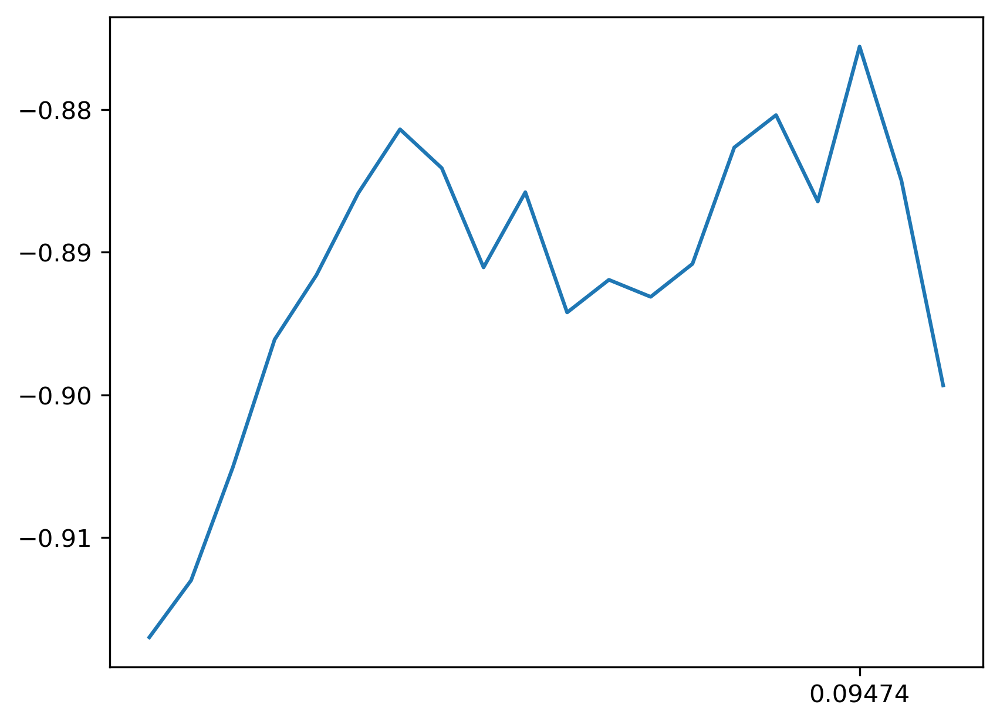

In [126]:
plt.figure(dpi=300)
plt.plot(epsilon, r2_alaska5)
plt.xticks(epsilon[position_max_r2_alaska])

0.001